# Taller: Explorando el Universo Latente — Stable Diffusion con Diffusers

**Objetivo:** Generar imágenes a partir de prompts textuales usando Stable Diffusion 1.5 con la librería `diffusers` de Hugging Face.

> Ejecutar en Google Colab con **GPU habilitada** (Runtime → Change runtime type → T4 GPU)

## 1. Instalación de dependencias

In [1]:
!pip install diffusers transformers accelerate --upgrade -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 70.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 74.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.1/516.1 kB 31.3 MB/s eta 0:00:00


## 2. Imports y configuración

In [2]:
import torch
import matplotlib.pyplot as plt
import os
from diffusers import StableDiffusionPipeline
from PIL import Image

os.makedirs('outputs', exist_ok=True)

print(f'CUDA available: {torch.cuda.is_available()}')
print(f'Device: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"}')

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


CUDA available: True
Device: Tesla T4


## 3. Cargar modelo Stable Diffusion 1.5

In [3]:
model_id = 'runwayml/stable-diffusion-v1-5'

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    safety_checker=None  # disable for faster loading in workshop context
)
pipe = pipe.to('cuda')
pipe.enable_attention_slicing()  # reduce VRAM usage

print('Model loaded successfully!')

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Model loaded successfully!


## 4. Actividad 1: Generación básica texto → imagen

  0%|          | 0/50 [00:00<?, ?it/s]

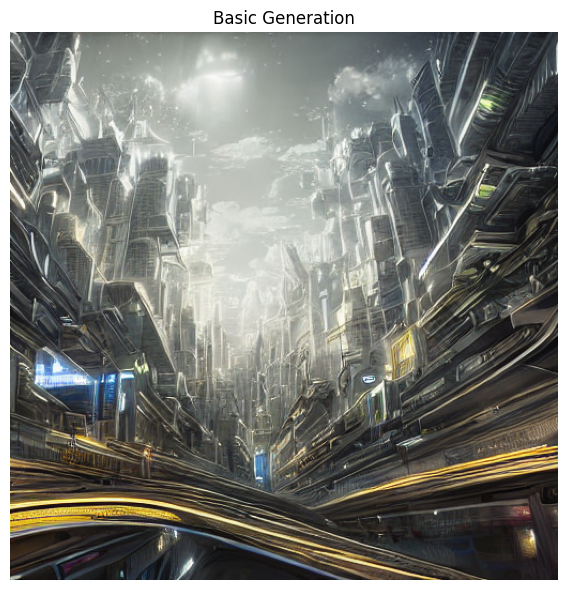

In [4]:
def generate_image(prompt, negative_prompt='', steps=50, guidance=7.5,
                   seed=42, width=512, height=512, filename=None):
    generator = torch.Generator('cuda').manual_seed(seed)
    result = pipe(
        prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=steps,
        guidance_scale=guidance,
        width=width,
        height=height,
        generator=generator
    )
    image = result.images[0]
    if filename:
        image.save(f'outputs/{filename}')
    return image


prompt_basic = 'A surreal futuristic city in the clouds, digital art, highly detailed'
img_basic = generate_image(prompt_basic, filename='01_basic_generation.png')

plt.figure(figsize=(6, 6))
plt.imshow(img_basic)
plt.axis('off')
plt.title('Basic Generation')
plt.tight_layout()
plt.savefig('outputs/01_basic_generation_plot.png', dpi=150, bbox_inches='tight')
plt.show()

## 5. Actividad 2: Exploración de parámetros clave

Comparar diferentes valores de `guidance_scale` y `num_inference_steps`.

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

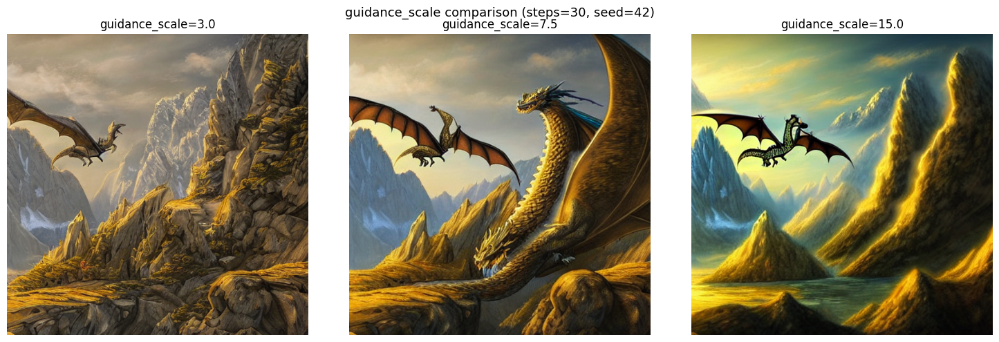

In [5]:
# --- guidance_scale comparison ---
guidance_values = [3.0, 7.5, 15.0]
prompt_param = 'A majestic dragon flying over a mountain range, fantasy art'

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('guidance_scale comparison (steps=30, seed=42)', fontsize=13)

for i, gs in enumerate(guidance_values):
    img = generate_image(prompt_param, steps=30, guidance=gs, seed=42,
                         filename=f'02_guidance_{gs}.png')
    axes[i].imshow(img)
    axes[i].set_title(f'guidance_scale={gs}')
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('outputs/02_guidance_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

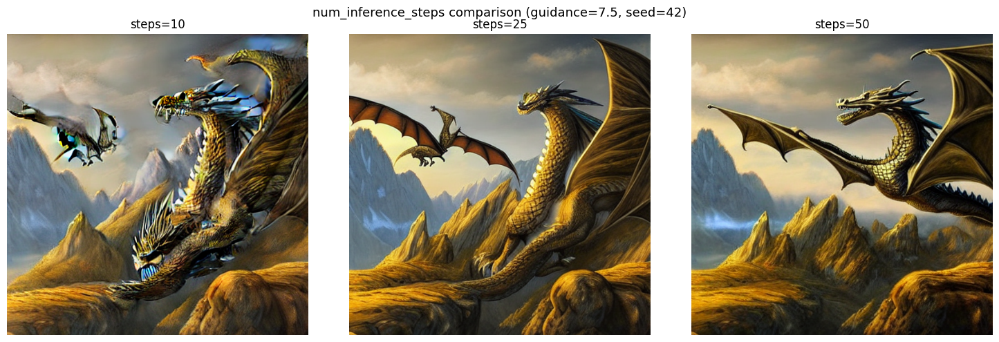

In [6]:
# --- num_inference_steps comparison ---
steps_values = [10, 25, 50]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('num_inference_steps comparison (guidance=7.5, seed=42)', fontsize=13)

for i, steps in enumerate(steps_values):
    img = generate_image(prompt_param, steps=steps, guidance=7.5, seed=42,
                         filename=f'03_steps_{steps}.png')
    axes[i].imshow(img)
    axes[i].set_title(f'steps={steps}')
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('outputs/03_steps_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Actividad 3: Comparación de estilos artísticos

Misma escena, diferentes estilos — efecto del estilo en el prompt.

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

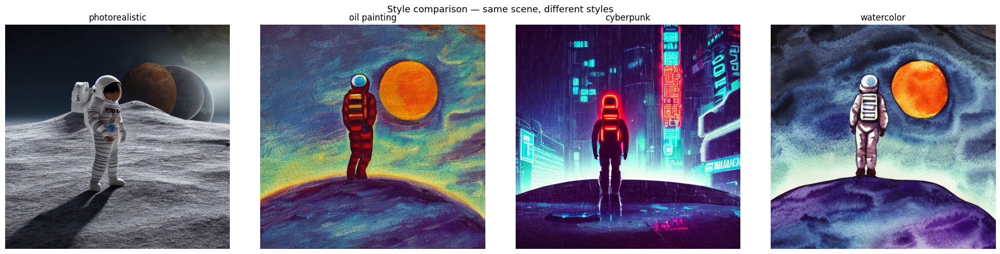

In [7]:
base_scene = 'a lone astronaut standing on an alien planet with two moons'

styles = [
    ('photorealistic', f'{base_scene}, photorealistic, 4k, detailed'),
    ('oil painting',   f'{base_scene}, oil painting, impressionist, textured'),
    ('cyberpunk',      f'{base_scene}, cyberpunk, neon lights, rain, blade runner'),
    ('watercolor',     f'{base_scene}, watercolor painting, soft colors, artistic'),
]

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('Style comparison — same scene, different styles', fontsize=13)

for i, (style_name, styled_prompt) in enumerate(styles):
    img = generate_image(styled_prompt, steps=40, guidance=7.5, seed=123,
                         filename=f'04_style_{style_name.replace(" ", "_")}.png')
    axes[i].imshow(img)
    axes[i].set_title(style_name)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('outputs/04_style_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Actividad 4: Efecto del negative prompt

Mismo prompt positivo — con y sin negative prompt.

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

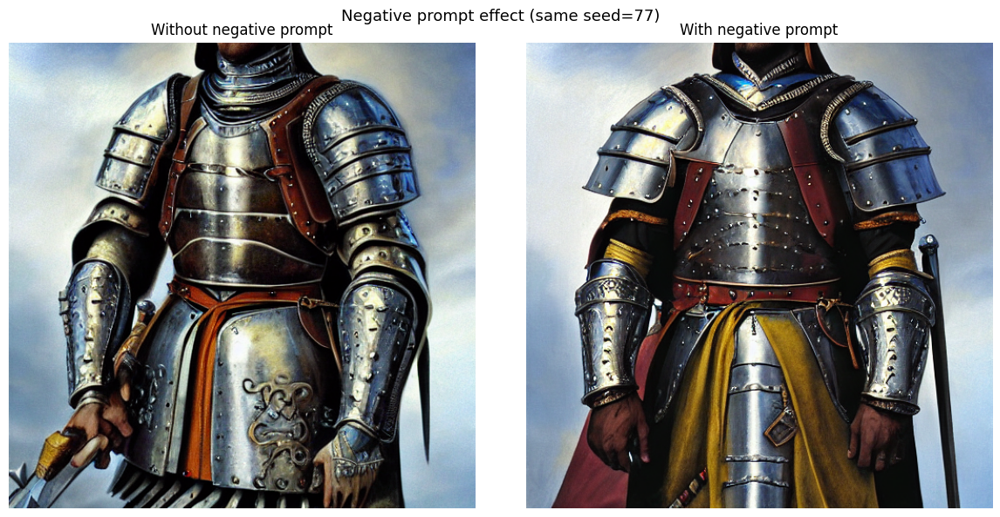

In [8]:
prompt_pos = 'portrait of a warrior in medieval armor, fantasy, detailed'
prompt_neg = 'blurry, low quality, deformed, ugly, bad anatomy, extra limbs, watermark, text'

img_no_neg  = generate_image(prompt_pos, steps=40, guidance=7.5, seed=77,
                              filename='05_no_negative_prompt.png')
img_with_neg = generate_image(prompt_pos, negative_prompt=prompt_neg,
                               steps=40, guidance=7.5, seed=77,
                               filename='05_with_negative_prompt.png')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle('Negative prompt effect (same seed=77)', fontsize=13)

axes[0].imshow(img_no_neg)
axes[0].set_title('Without negative prompt')
axes[0].axis('off')

axes[1].imshow(img_with_neg)
axes[1].set_title('With negative prompt')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('outputs/05_negative_prompt_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 8. Actividad 5 (Bonus): Generación por lotes

Lista de prompts → generar y visualizar toda la galería.

  0%|          | 0/35 [00:00<?, ?it/s]

[1/6] done


  0%|          | 0/35 [00:00<?, ?it/s]

[2/6] done


  0%|          | 0/35 [00:00<?, ?it/s]

[3/6] done


  0%|          | 0/35 [00:00<?, ?it/s]

[4/6] done


  0%|          | 0/35 [00:00<?, ?it/s]

[5/6] done


  0%|          | 0/35 [00:00<?, ?it/s]

[6/6] done


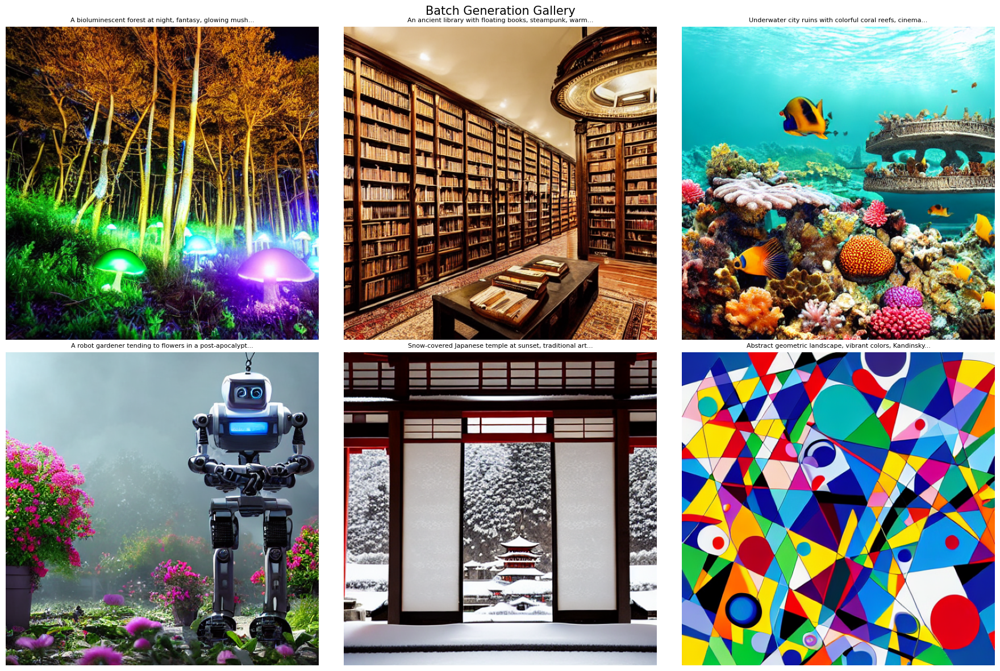

In [9]:
batch_prompts = [
    'A bioluminescent forest at night, fantasy, glowing mushrooms, magical',
    'An ancient library with floating books, steampunk, warm lighting',
    'Underwater city ruins with colorful coral reefs, cinematic lighting',
    'A robot gardener tending to flowers in a post-apocalyptic world, digital art',
    'Snow-covered Japanese temple at sunset, traditional art style',
    'Abstract geometric landscape, vibrant colors, Kandinsky style',
]

neg = 'blurry, low quality, deformed, ugly, bad anatomy'
batch_images = []

for i, p in enumerate(batch_prompts):
    img = generate_image(p, negative_prompt=neg, steps=35, guidance=7.5,
                         seed=i * 13, filename=f'06_batch_{i+1:02d}.png')
    batch_images.append((img, p))
    print(f'[{i+1}/{len(batch_prompts)}] done')

# Gallery grid
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Batch Generation Gallery', fontsize=15)

for ax, (img, p) in zip(axes.flat, batch_images):
    ax.imshow(img)
    ax.set_title(p[:55] + '...', fontsize=8, wrap=True)
    ax.axis('off')

plt.tight_layout()
plt.savefig('outputs/06_batch_gallery.png', dpi=150, bbox_inches='tight')
plt.show()

## 9. Actividad 6 (Bonus): Prompt Engineering — variantes de un mismo concepto

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

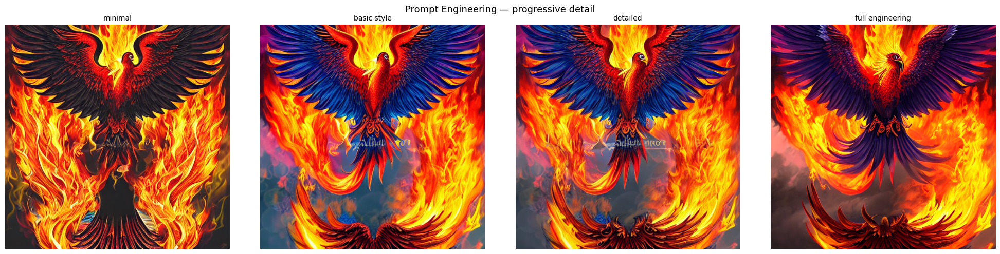

In [10]:
# Same concept, increasing prompt detail/quality modifiers
base = 'a phoenix rising from flames'

engineering_prompts = [
    base,
    f'{base}, fantasy art, vibrant colors',
    f'{base}, fantasy art, vibrant colors, highly detailed feathers, dramatic lighting',
    f'{base}, masterpiece, best quality, fantasy art, vibrant colors, highly detailed feathers, '
    'dramatic lighting, epic composition, 4k, artstation',
]

labels = ['minimal', 'basic style', 'detailed', 'full engineering']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('Prompt Engineering — progressive detail', fontsize=13)

for i, (ep, label) in enumerate(zip(engineering_prompts, labels)):
    img = generate_image(ep, negative_prompt=neg, steps=40, guidance=7.5,
                         seed=999, filename=f'07_prompt_eng_{i+1}.png')
    axes[i].imshow(img)
    axes[i].set_title(label, fontsize=10)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('outputs/07_prompt_engineering.png', dpi=150, bbox_inches='tight')
plt.show()

## 10. Resumen de outputs generados

In [11]:
output_files = sorted(os.listdir('outputs'))
print(f'Total files generated: {len(output_files)}')
for f in output_files:
    size = os.path.getsize(f'outputs/{f}') / 1024
    print(f'  {f:50s} {size:6.1f} KB')

Total files generated: 30
  01_basic_generation.png                             518.0 KB
  01_basic_generation_plot.png                       1154.6 KB
  02_guidance_15.0.png                                393.6 KB
  02_guidance_3.0.png                                 492.1 KB
  02_guidance_7.5.png                                 442.0 KB
  02_guidance_comparison.png                         2134.7 KB
  03_steps_10.png                                     470.0 KB
  03_steps_25.png                                     443.1 KB
  03_steps_50.png                                     428.9 KB
  03_steps_comparison.png                            2153.0 KB
  04_style_comparison.png                            3232.6 KB
  04_style_cyberpunk.png                              477.5 KB
  04_style_oil_painting.png                           546.3 KB
  04_style_photorealistic.png                         478.4 KB
  04_style_watercolor.png                             506.5 KB
  05_negative_prompt_comparis